In [1]:
library(mxnet)

In [2]:
seed <- 42
set.seed(seed)

In [3]:
train <- read.csv('data/digits/train.csv', header = TRUE)
test <- read.csv('data/digits/test.csv', header = TRUE)

# Exploration

In [4]:
digit_groups <- split(train, train$label)

In [5]:
show_digits <- function(data, aggr_func = NULL) {
    grey_scale <- gray(10:0 / 10)
    output <- t(data)
    if(!missing(aggr_func)) {
        output <- apply(output, 1, aggr_func)
    }
    u <- matrix(output, ncol = 28)
    v <- u
    for(i in 1:28)  {
        v[i,] <- rev(u[i,])
    }
    image(v, col = grey_scale, axes = FALSE)
}

show_digit <- function(data) {
    show_digits(data)
}

In [6]:
removed_label <- lapply(digit_groups, function(x) { x["label"] <- NULL; x })

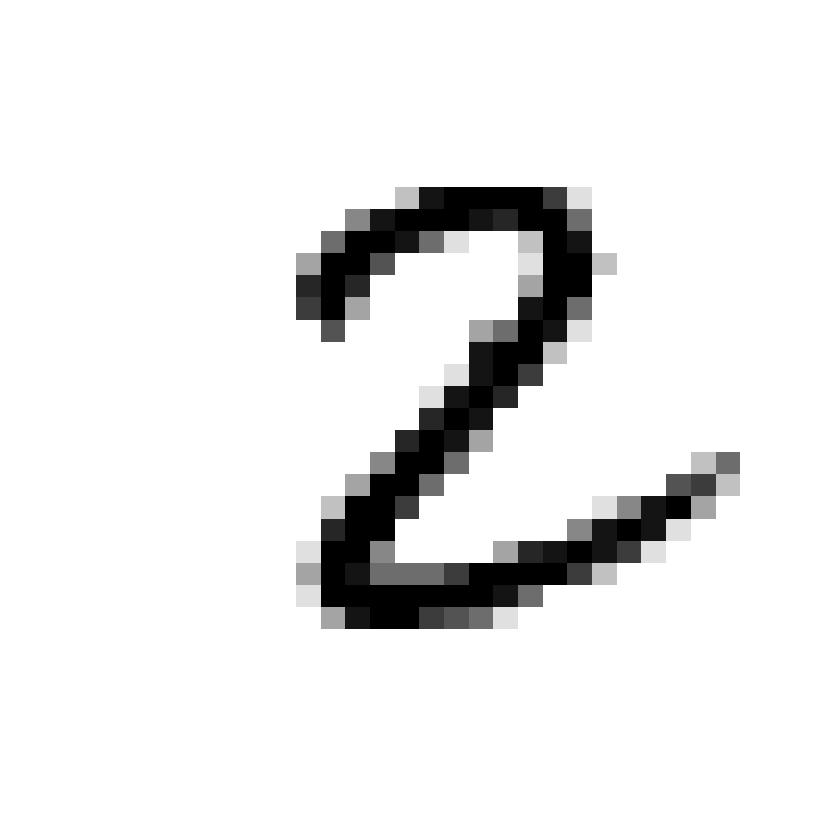

In [7]:
show_digit(removed_label[[3]][1, ])

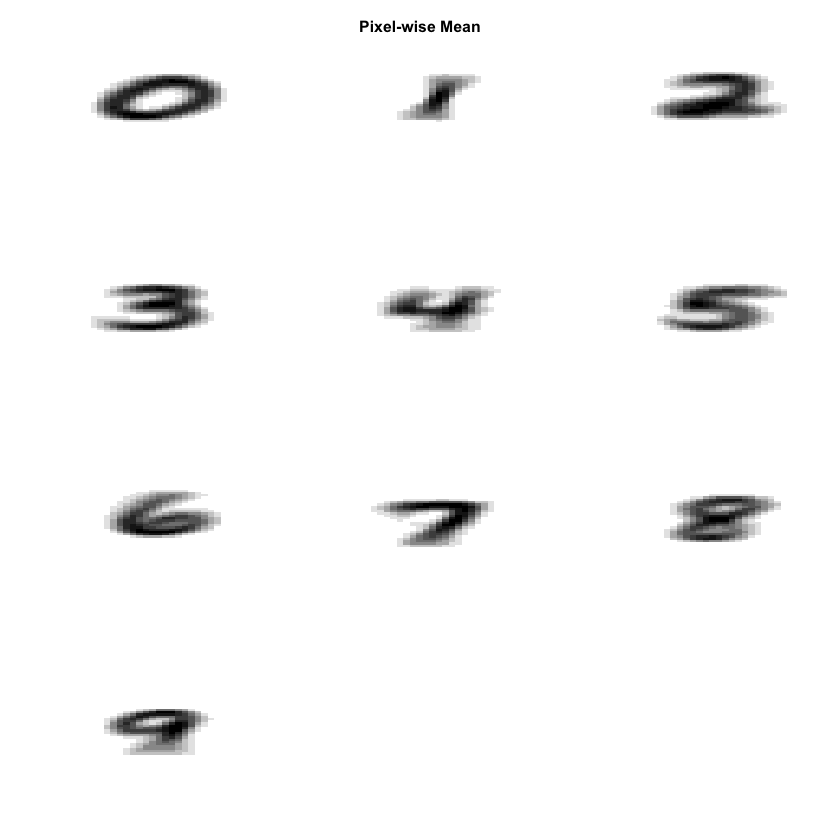

In [8]:
par(mfrow=c(4,3))
plot <- lapply(removed_label, show_digits, aggr_func = mean)
title("Pixel-wise Mean", outer=TRUE, line = -2)

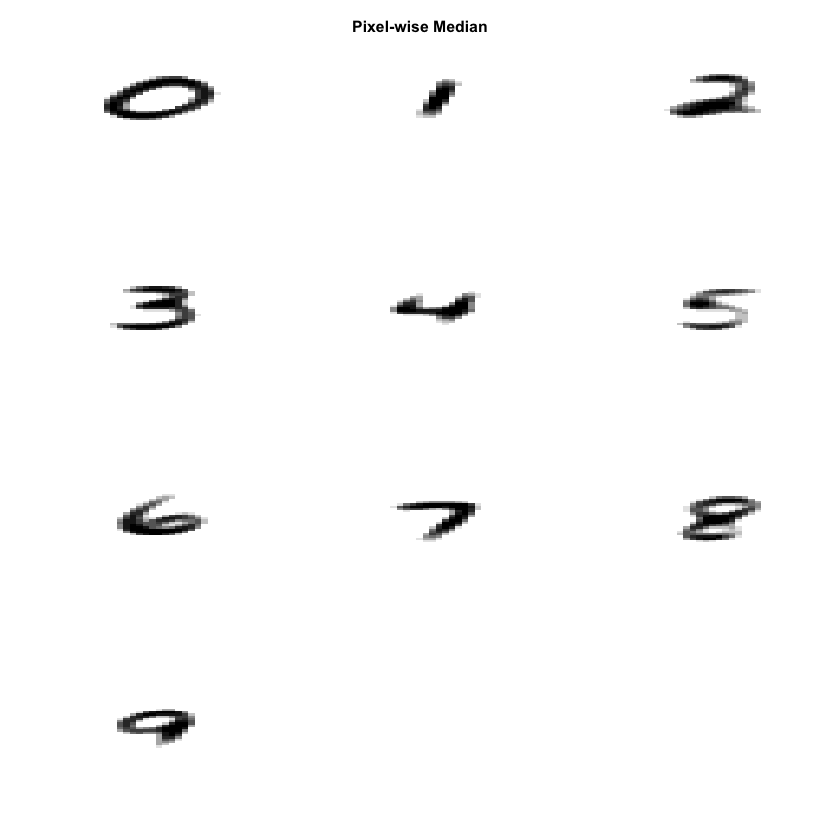

In [9]:
par(mfrow=c(4,3))
plot <- lapply(removed_label, show_digits, aggr_func = median)
title("Pixel-wise Median", outer=TRUE, line = -2)

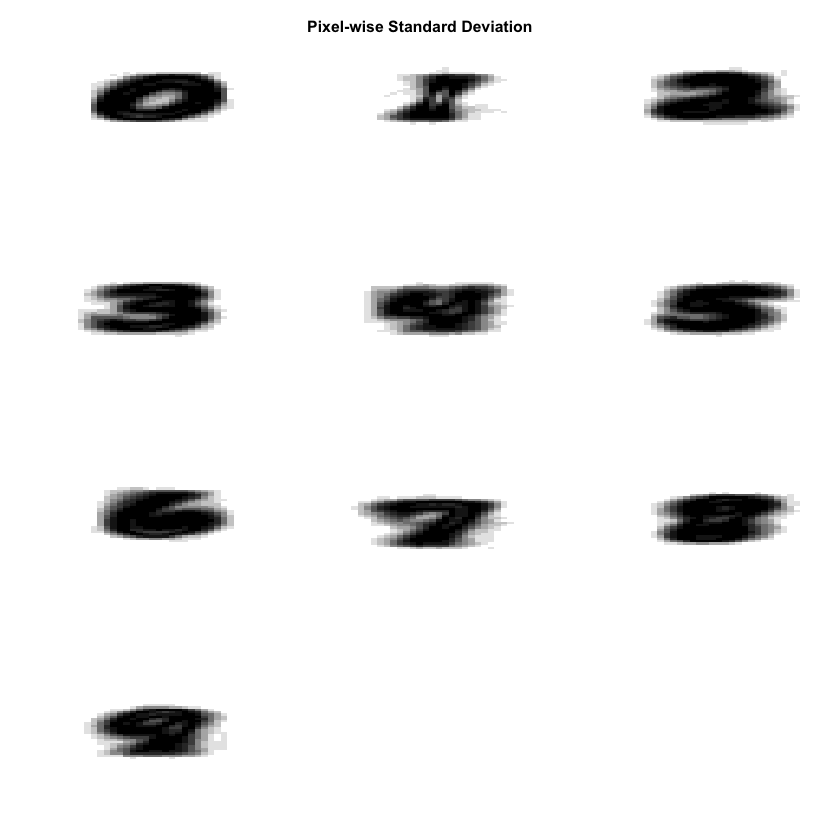

In [10]:
par(mfrow=c(4,3))
plot <- lapply(removed_label, show_digits, aggr_func = sd)
title("Pixel-wise Standard Deviation", outer=TRUE, line = -2)

# Preprocessing

In [11]:
train_matrix <- data.matrix(train)
test_matrix <- data.matrix(test)
x_train <- t(train_matrix[, -1])
y_train <- train_matrix[, 1]

In [12]:
x_train <- x_train / 255

In [13]:
x_test <- t(test_matrix[, -1])
y_test <- test_matrix[, 1]

In [14]:
x_test <- x_test / 255

# Training Feed Forward NN

In [30]:
data <- mx.symbol.Variable("data")
fc1 <- mx.symbol.FullyConnected(data, name="fc1", num_hidden=128)
act1 <- mx.symbol.Activation(fc1, name="act1", act_type="tanh")
fc2 <- mx.symbol.FullyConnected(act1, name="fc2", num_hidden=64)
act2 <- mx.symbol.Activation(fc2, name="act2", act_type="tanh")
fc3 <- mx.symbol.FullyConnected(act2, name="fc3", num_hidden=10)
softmax <- mx.symbol.SoftmaxOutput(fc3, name="sm")
devices <- mx.cpu()
mx.set.seed(0)

In [31]:
net <- mx.model.FeedForward.create(softmax, X=x_train, y=y_train,
                                    ctx=devices, num.round=10, array.batch.size=100,
                                    learning.rate=0.07, momentum=0.9,  eval.metric=mx.metric.accuracy,
                                    initializer=mx.init.uniform(0.07),
                                    epoch.end.callback=mx.callback.log.train.metric(100), 
                                    array.layout = 'colmajor');

Start training with 1 devices
[1] Train-accuracy=0.619795918367347
[2] Train-accuracy=0.8836
[3] Train-accuracy=0.9154
[4] Train-accuracy=0.9298
[5] Train-accuracy=0.9452
[6] Train-accuracy=0.9508
[7] Train-accuracy=0.9594
[8] Train-accuracy=0.9712
[9] Train-accuracy=0.982
[10] Train-accuracy=0.9858


# Visualization

In [32]:
graph.viz(net$symbol$as.json())

HTML widgets cannot be represented in plain text (need html)

## Evaluation

In [33]:
evaluate_model <- function(model, test_data, test_labels) {
    predictions <- predict(model, test_data, array.layout = "colmajor")
    predicted_labels <- max.col(t(predictions)) - 1
    cat("Predicted labels distribution \n\n")
    print(table(predicted_labels))
    cat("\n\nActual labels distribution \n\n")
    print(table(test_labels))
    prediction_results <- data.frame(actual=test_labels, predicted=predicted_labels)
    prediction_t <- table(prediction_results$actual, prediction_results$predicted)
    cat("\n\nConfussion table \n")
    print(prediction_t)
    cat("\nAccuracy:", sum(diag(prediction_t)) / nrow(prediction_results))
    prediction_results
}

In [34]:
predictions <- evaluate_model(net, x_test, y_test)

Predicted labels distribution 

predicted_labels
  0   1   2   3   4   5   6   7   8   9 
 94 101 104  81 103 122  94  98 105  98 


Actual labels distribution 

test_labels
  0   1   2   3   4   5   6   7   8   9 
100 100 100 100 100 100 100 100 100 100 


Confussion table 
   
     0  1  2  3  4  5  6  7  8  9
  0 93  0  1  0  0  2  1  0  2  1
  1  0 99  1  0  0  0  0  0  0  0
  2  0  0 96  1  1  0  0  1  1  0
  3  0  0  3 80  0 13  0  0  3  1
  4  0  1  0  0 92  1  2  1  0  3
  5  0  1  0  0  0 98  0  0  1  0
  6  0  0  1  0  1  5 91  0  2  0
  7  0  0  0  0  3  0  0 94  0  3
  8  0  0  1  0  1  2  0  0 96  0
  9  1  0  1  0  5  1  0  2  0 90

Accuracy: 0.929

### What predictions were wrong?

In [20]:
show_wrong_prediction <- function(predictions, idx, test_data) {
    wrong_predictions <- predictions[predictions$actual != predictions$predicted, ]
    wrong_prediction <- wrong_predictions[idx, ]
    test_idx <- as.integer(rownames(wrong_prediction)[1])
    wrong_prediction_data <- as.data.frame(test_data[test_idx, ])
    wrong_prediction_data["label"] <- NULL
    show_digit(wrong_prediction_data)
    text( 0.1, 0, wrong_prediction$predicted, cex = 3, col = 2, pos = c(3,4))
    text( 0.9, 0.9, wrong_prediction$actual, cex = 3, col = 3, pos = c(4, 4))
}

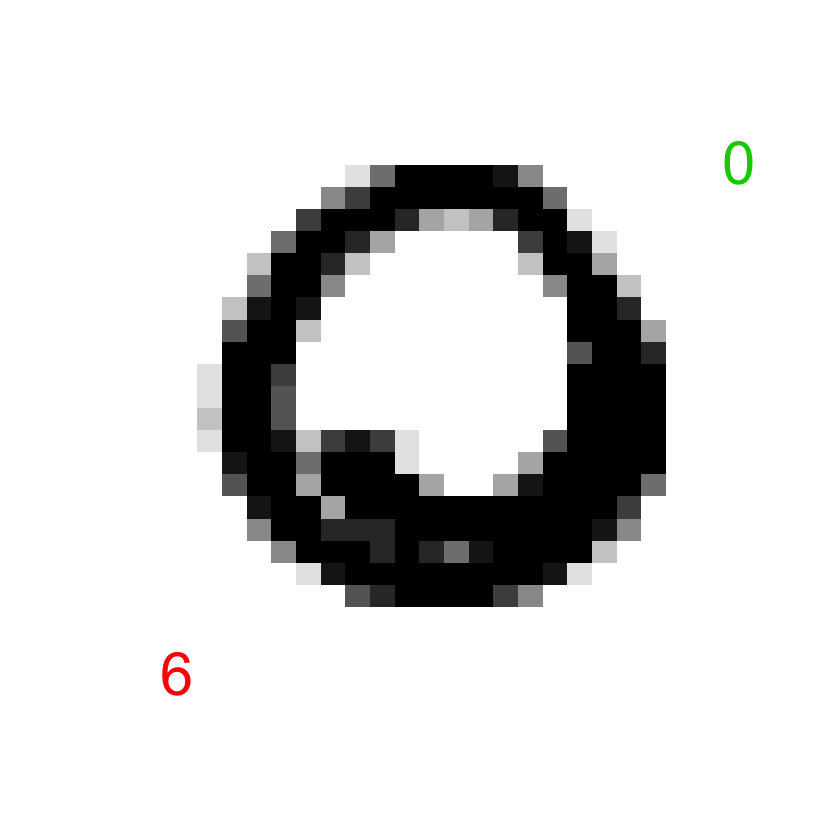

In [21]:
show_wrong_prediction(predictions, 1, test)

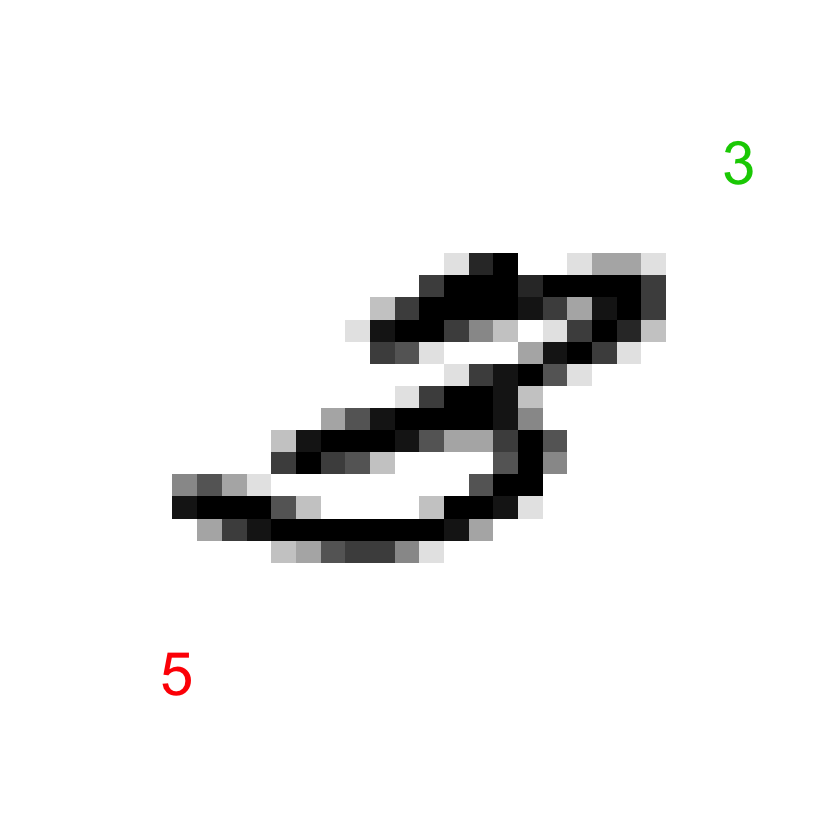

In [22]:
show_wrong_prediction(predictions, 10, test)

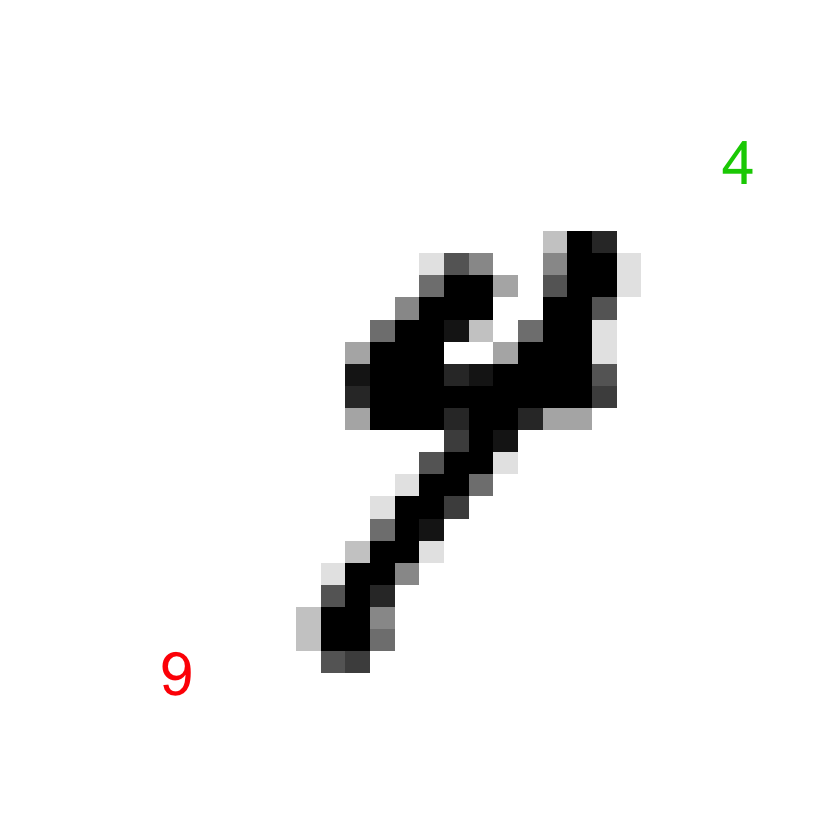

In [23]:
show_wrong_prediction(predictions, 20, test)

# Train Convolutional NN with ReLU activation

In [24]:
data <- mx.symbol.Variable("data")
devices<-mx.cpu()
# first conv
conv1 <- mx.symbol.Convolution(data=data, kernel=c(5,5), num_filter=20)
tanh1 <- mx.symbol.Activation(data=conv1, act_type="relu")
pool1 <- mx.symbol.Pooling(data=tanh1, pool_type="max",
                           kernel=c(2,2), stride=c(2,2))
drop1 <- mx.symbol.Dropout(data=pool1,p=0.5)
# second conv
conv2 <- mx.symbol.Convolution(data=drop1, kernel=c(5,5), num_filter=50)
tanh2 <- mx.symbol.Activation(data=conv2, act_type="relu")
pool2 <- mx.symbol.Pooling(data=tanh2, pool_type="max",
                           kernel=c(2,2), stride=c(2,2))
drop2 <- mx.symbol.Dropout(data=pool2,p=0.5)
# first fullc
flatten <- mx.symbol.Flatten(data=drop2)
fc1 <- mx.symbol.FullyConnected(data=flatten, num_hidden=500)
tanh4 <- mx.symbol.Activation(data=fc1, act_type="relu")
drop4 <- mx.symbol.Dropout(data=tanh4,p=0.5)
# second fullc
fc2 <- mx.symbol.FullyConnected(data=drop4, num_hidden=10)
# loss
lenet <- mx.symbol.SoftmaxOutput(data=fc2)
conv_net_train <- x_train
dim(conv_net_train) <- c(28, 28, 1, ncol(x_train))
conv_net_test <- x_test
dim(conv_net_test) <- c(28, 28, 1, ncol(x_test))
mx.set.seed(0)
tic <- proc.time()
conv_net <- mx.model.FeedForward.create(lenet, X=conv_net_train, y=y_train,
                                            ctx=devices, num.round=60, array.batch.size=100,
                                            learning.rate=0.05, momentum=0.9, wd=0.00001,
                                            eval.metric=mx.metric.accuracy,
                                            epoch.end.callback=mx.callback.log.train.metric(100),
                                            array.layout = 'colmajor')

Start training with 1 devices
[1] Train-accuracy=0.0975510204081633
[2] Train-accuracy=0.0906
[3] Train-accuracy=0.09
[4] Train-accuracy=0.0952
[5] Train-accuracy=0.1318
[6] Train-accuracy=0.5626
[7] Train-accuracy=0.8402
[8] Train-accuracy=0.8954
[9] Train-accuracy=0.9206
[10] Train-accuracy=0.929
[11] Train-accuracy=0.931
[12] Train-accuracy=0.94
[13] Train-accuracy=0.948
[14] Train-accuracy=0.9498
[15] Train-accuracy=0.948
[16] Train-accuracy=0.954
[17] Train-accuracy=0.9576
[18] Train-accuracy=0.9602
[19] Train-accuracy=0.9616
[20] Train-accuracy=0.9592
[21] Train-accuracy=0.9626
[22] Train-accuracy=0.9636
[23] Train-accuracy=0.967
[24] Train-accuracy=0.9676
[25] Train-accuracy=0.9636
[26] Train-accuracy=0.9722
[27] Train-accuracy=0.97
[28] Train-accuracy=0.974
[29] Train-accuracy=0.974599999999999
[30] Train-accuracy=0.9718
[31] Train-accuracy=0.975
[32] Train-accuracy=0.9758
[33] Train-accuracy=0.969
[34] Train-accuracy=0.9674
[35] Train-accuracy=0.9746
[36] Train-accuracy=0.9758

## Visualize our model

In [25]:
graph.viz(conv_net$symbol$as.json())

HTML widgets cannot be represented in plain text (need html)

## Evalution

In [26]:
predictions <- evaluate_model(conv_net, conv_net_test, y_test)

Predicted labels distribution 

predicted_labels
  0   1   2   3   4   5   6   7   8   9 
 99 103  99  99 100  99 102 100 100  99 


Actual labels distribution 

test_labels
  0   1   2   3   4   5   6   7   8   9 
100 100 100 100 100 100 100 100 100 100 


Confussion table 
   
      0   1   2   3   4   5   6   7   8   9
  0  99   0   0   0   0   0   1   0   0   0
  1   0 100   0   0   0   0   0   0   0   0
  2   0   0  98   0   0   0   1   1   0   0
  3   0   0   0  99   0   0   0   0   1   0
  4   0   2   0   0  98   0   0   0   0   0
  5   0   1   0   0   0  99   0   0   0   0
  6   0   0   0   0   0   0 100   0   0   0
  7   0   0   0   0   0   0   0  98   1   1
  8   0   0   1   0   0   0   0   0  98   1
  9   0   0   0   0   2   0   0   1   0  97

Accuracy: 0.986

### What predictions were wrong?

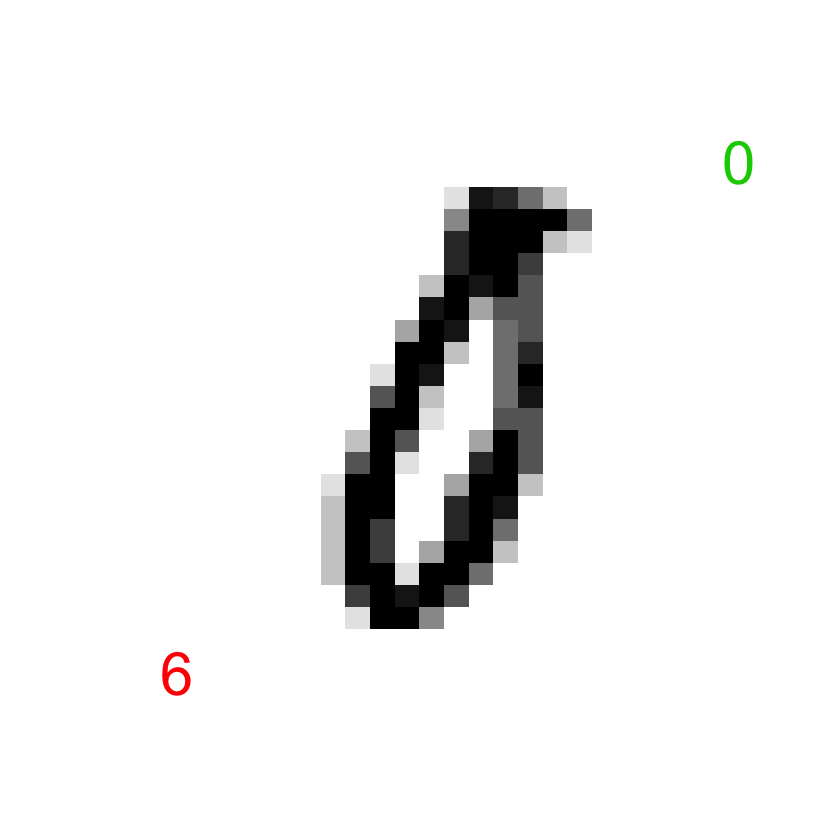

In [27]:
show_wrong_prediction(predictions, 1, test)

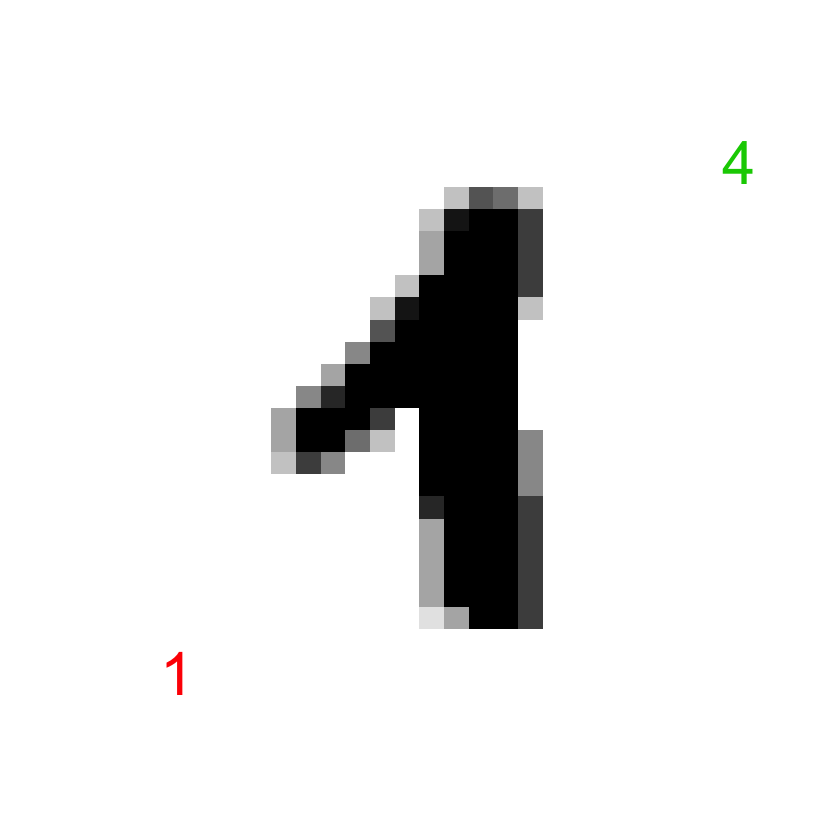

In [28]:
show_wrong_prediction(predictions, 5, test)

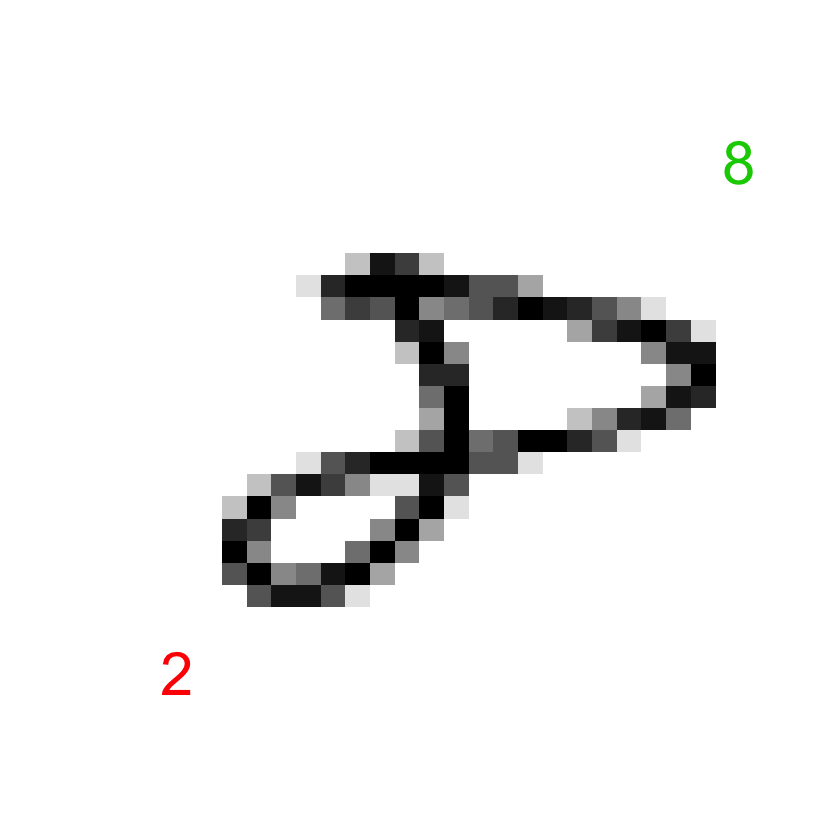

In [29]:
show_wrong_prediction(predictions, 10, test)

# References

[{mxnet} MNIST example](http://tjo-en.hatenablog.com/entry/2016/03/30/233848) <br/>
[Handwritten Digits Classification Competition](http://mxnet.io/tutorials/r/mnistCompetition.html) <br/>
[Explore Digit Recognizer Training Set](https://www.kaggle.com/enrique1500/digit-recognizer/explore-digit-recognizer-training-set) <br/>
[A little H2O deeplearning experiment on the MNIST data set](https://longhowlam.wordpress.com/2015/11/25/a-little-h2o-deeplearning-experiment-on-the-mnist-data-set/)